<center>
<h1>Mejor Ubicación Hospital</h1>
    <h3>Manuel Arias  &nbsp;  &nbsp; Lina Prado</h3>
    <h3>Jeisson Prieto  &nbsp;  &nbsp; Cristian Pulido </h3>
    <h3>Julián Torres</h3>
</center>


In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [21]:
import numpy as np
import scipy
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import multivariate_normal
import matplotlib.colors as mcolors
from scipy import integrate
from scipy.optimize import minimize
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.figure_factory as ff
init_notebook_mode(connected=True)
from scipy.optimize import curve_fit
from plotly import tools

In [22]:
# np.inf distancia del maximo
def norma(x,orden=2):
    return np.linalg.norm(x,axis=1,ord=orden)

In [23]:
registros=6*np.random.rand(25,2)
registros=np.take_along_axis(registros,registros.argsort(axis=0),axis=0)
registros=pd.DataFrame(registros,columns=['Distancia','Tiempo']).sort_values('Distancia').reset_index(drop=True)

In [24]:
trace = go.Scatter(
    x = registros.Distancia[1:],
    y = registros.Tiempo[1:],
    mode = 'markers',
    name = 'Registros'
    
)
point = go.Scatter(
    x = [0],
    y = [0],
    mode = 'markers',
    name = 'Origen'
)
layout = go.Layout(
    title='Registros Distancia Vs. Tiempo',
    font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
    xaxis=dict(
        title='Distancia',
        autorange=True,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Tiempo',
        autorange=True,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)


data = [trace,point]
fig = go.Figure(data=data, layout=layout)
# Plot and embed in ipython notebook!
iplot(fig)

## Hipótesis
<ul>
    <li>La velocidad de una ambulancia es independiente del lugar de la ciudad por donde transite.</li>
   
</ul>


<h2> Aproximación de la función tiempo de llegada de una ambulancia$:= t(x)$</h2>
<ul>
    <li> Interpolación splines cúbicos </li>
    <li> Ajuste Lineal</li>
    <li> Ajuste Cuadratico</li>
    <li> Ajuste Cúbico</li>
</ul>



In [25]:
xs = np.sort(list(np.arange(0, max(registros.Distancia), 0.1))+list(registros.Distancia))
for i in xs:
    registros=registros.append({'Distancia':i},ignore_index=True)
registros=registros.drop_duplicates('Distancia').sort_values('Distancia').reset_index(drop=True)
originales=registros[['Distancia','Tiempo']].dropna()

In [26]:
cubic_spline=scipy.interpolate.CubicSpline(originales.Distancia, originales.Tiempo, axis=0, bc_type='not-a-knot', extrapolate=None)

In [27]:
registros['Spline']=cubic_spline(registros.Distancia)
registros['Spline_error']=abs(registros.Tiempo-registros.Spline)

In [28]:
def polinomio_ajuste(x,y,grado):
    
    columns=grado+1
    filas = len(x)
    
    matriz=np.ones((filas,columns))
    
    for i in range(columns):
        matriz[:,i]=np.power(x,i)
        #matriz[:,i]=np.power(x,i) para considerar coeficiente independiente
        #matriz[:,i]=np.power(x,i+1) para no considerar coeficiente independiente
    
    y=np.array(y).reshape((len(y),1))
    
    coef=np.dot(np.dot(np.linalg.inv(np.dot(matriz.T,matriz)),matriz.T),y)
    
    y_approx=np.dot(matriz,coef)
    
    return coef, y_approx

def evaluar_polinomio(x,coeficientes):
    return np.dot(np.array([np.power(x,len(coeficientes)-1-i) for i in range(len(coeficientes))]).T,coeficientes).flatten()
    #len(coeficientes)-1-i para considerar coeficiente independiente
    #len(coeficientes)-i para no considerar coeficiente independiente
    

In [29]:
polinomios=[]
for i,j in zip([1,2,3],['Lineal','Cuadratico','Cúbico']):
    coef,t_approx=polinomio_ajuste(originales.Distancia,originales.Tiempo,i)
    polinomios.append(coef)
    registros[j]=evaluar_polinomio(registros.Distancia,coef)
    registros[j+'_error']=abs(registros[j]-registros.Tiempo)  


In [30]:
aproximaciones=[]
for i in ['Spline','Lineal','Cuadratico','Cúbico']:
    grafica=go.Scatter(
        x = registros.Distancia,
        y = registros[i],

        mode = 'lines',
        name = i,
        error_y=dict(
                type='data',
                array=registros[i+'_error'],
                visible=True
                )

    )
    
    
    aproximaciones.append(grafica)
data = data+aproximaciones
fig = go.Figure(data=data, layout=layout)
# Plot and embed in ipython notebook!
iplot(fig)

In [31]:
Errores=pd.DataFrame(registros[['Spline_error','Lineal_error','Cuadratico_error','Cúbico_error']].sum(),columns=['Error Estimación'])

trace = go.Bar(
    x=Errores['Error Estimación']+0.01,
    y=list(Errores.index),
    orientation='h',
    text=list(Errores.index),
    textposition = 'auto',
    marker=dict(
        color='rgb(158,202,225)',
        line=dict(
            color='rgb(8,48,107)',
            width=1),
    ),   
)
layout = go.Layout(
    title='Errores de Estimación',
    font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
    xaxis=dict(
        title='Error',
        autorange=True,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
            )
        ),
    yaxis=dict(
        autorange=True,
        showgrid=False,
        zeroline=False,
        showline=False,
        ticks='',
        showticklabels=False
    )
    )



data = [trace]
fig = go.Figure(data=data, layout=layout)
# Plot and embed in ipython notebook!
iplot(fig)

In [32]:
soluciones={}
grado_funcion=Errores.reset_index(drop=True)[1:].idxmin().values[0]
distance_order=2 #np.inf 

In [33]:
def t(emergencia,hospital,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return evaluar_polinomio(norma(np.array(emergencia)-np.array(hospital),distance_order),coeficientes)

In [39]:
frequency = np.random.randint(0,10,size=(6,6))

In [40]:

means=[]
for row in range(6):
    for col in range(6):
        means.append([col+0.5,  row+0.5])
means=np.array(means)
def discreto(hospital,frequency=frequency,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return sum(t(means,hospital,coeficientes,distance_order)*frequency.flatten())

## Frecuencia Llamadas en la ciudad

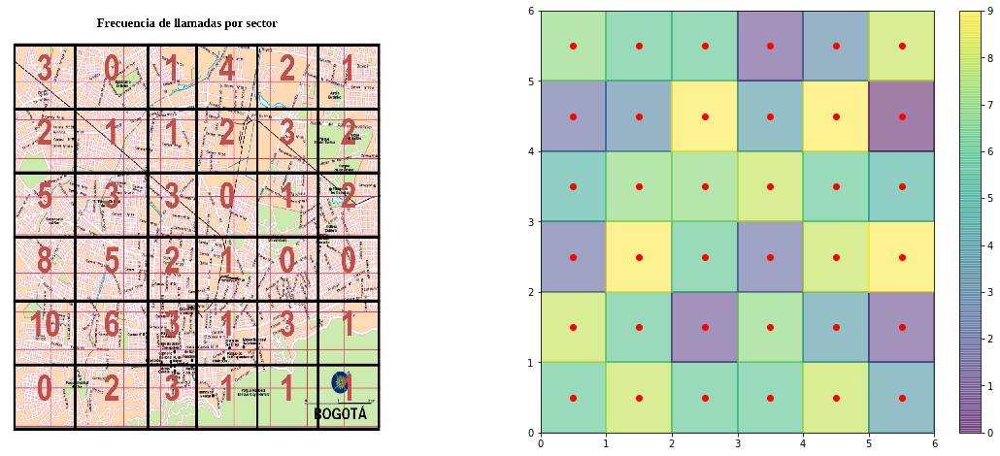

In [41]:
X,Y=np.meshgrid(np.arange(7),np.arange(7))

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,8))
ax1.imshow(plt.imread("img.png"))
ax1.axis('off')
im=ax2.pcolormesh(X,Y,frequency,cmap='viridis',edgecolors='face',alpha=0.5,snap=True)
ax2.scatter(means[:,0],means[:,1],c='r')
fig.colorbar(im, ax=ax2)
plt.show()

# Modelo Discreto

## Hipótesis
<ul>
    <li>Que  la  ambulancia  llegue  al  centro  de  la  cuadricula  donde  se  produjo  una  emergencia
implica que dicha emergencia ha sido atendida.</li>
    <li>El hospital puede ser ubicado en cualquier parte de la ciudad.</li>
    <li>Las llamadas de emergencia son independientes entre si</li>
    <li>Todas las llamadas de una cuadrícula suceden en el centro de esta</li>
</ul>

### Sean $f(x_i,y_i)$ la función que retorna la frecuencia de llamadas del punto central de una región y $d((x_1,y_1),(x_2,y_2))$ la función que retorna la distancia entre dos puntos, la función a optimizar se define como:
$$ H((x_{0},y_{0}))=\sum_{i=1}^{36}f(x_i,y_i) t\left( d((x_0,y_0),(x_i,y_i)) \right)$$
### Donde $(x_{0},y_{0})$ es la posición del hospital

In [42]:
step=0.025
X, Y = np.meshgrid(np.arange(0, 6., step), np.arange(0, 6., step))
points=[i for i in zip(X.flatten(),Y.flatten())]

In [43]:
def c1(x):
    return x[0]
def c2(x):
    return x[1]
def c3(x):
    return 6- x[0]
def c4(x):
    return 6- x[1]
cons = [{'type':'ineq', 'fun': c1},
        {'type':'ineq', 'fun': c2},
        {'type':'ineq', 'fun': c3},
        {'type':'ineq', 'fun': c4}]


In [44]:
def discreto(hospital,frequency=frequency,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return sum(t(means,hospital,coeficientes,distance_order)*frequency.flatten())

In [45]:
sol_d=minimize(discreto, [2,2], method = 'COBYLA',args=(frequency,polinomios[grado_funcion-1],distance_order),tol=1e-10)
soluciones['Discreto']=sol_d.x
print("Salida Optimización")
print(sol_d)

Salida Optimización
     fun: 628.2155022313309
   maxcv: 0.0
 message: 'Optimization terminated successfully.'
    nfev: 78
  status: 1
 success: True
       x: array([2.86565032, 3.06044226])


In [46]:
h_disc=[discreto(i,frequency=frequency,coeficientes=polinomios[grado_funcion-1],distance_order=2) for i in points]
fig = tools.make_subplots(rows=1, cols=2,
                          specs=[[{'is_3d': False}, {'is_3d': True}]],print_grid=False)

# adding surfaces to subplots.
fig.append_trace(dict(type='contour', x=X[0], y=X[0], z=np.array(h_disc).reshape(X.shape), colorscale='Viridis',
                      showscale=True), 1, 1)

fig.append_trace(dict(type='scatter', x=[sol_d.x[0]], y=[sol_d.x[1]],mode = 'markers'), 1, 1)

fig.append_trace(dict(type='surface', x=X[0], y=X[0], z=np.array(h_disc).reshape(X.shape), colorscale='Viridis',
                       showscale=False), 1, 2)
fig['layout'].update(title='Evaluación H(x,y)',font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'))
iplot(fig)


# Modelo Continuo

## Hipótesis
<ul>
    <li>Las llamadas pueden surgir de cualquier punto de la ciudad y la ambulancia debe llegar al punto para atender la emergencia</li>
    <li>En cada casilla las llamadas se comportan siguiendo una distribución normal con media en el centro de la casilla. </li>
    <li>En las casillas donde la frecuenia de llamadas era cero aún tienen la posibilidad de ocurrencia de llamada.</li>
</ul>

In [47]:
pi=frequency.flatten()/frequency.sum()
def fdp(x):
    return 8/np.pi*sum(pi*np.exp(-8*np.sum(np.power(means-x,2),axis=1)))

In [48]:
step=0.025
X, Y = np.meshgrid(np.arange(0, 6., step), np.arange(0, 6., step))
points=[i for i in zip(X.flatten(),Y.flatten())]

In [49]:
fdp_values=np.array([fdp(i) for i in points])

In [50]:
# Centro de masa
cm=sum([i*j for i,j in zip(fdp_values,np.array(points))])/sum(fdp_values)
soluciones['Centro Masa']=cm

In [51]:
Z=fdp_values.reshape(X.shape)
fig = tools.make_subplots(rows=1, cols=2,
                          specs=[[{'is_3d': False}, {'is_3d': True}]],print_grid=False)

# adding surfaces to subplots.
fig.append_trace(dict(type='contour', x=X[0], y=X[0], z=Z, colorscale='Viridis',
                      showscale=True), 1, 1)

fig.append_trace(dict(type='surface', x=X[0], y=X[0], z=Z, colorscale='Viridis',
                       showscale=False), 1, 2)
fig['layout'].update(title='Densidad Probabilidad Llamadas y Curvas de nivel',font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'))

iplot(fig)

In [52]:
def parameters(hospital=[3,3],coeficientes=polinomios[grado_funcion-1],distance_order=distance_order):

    def integrando(y,x,hospital=hospital,coeficientes=coeficientes,distance_order=distance_order):
        return (fdp([x,y])*t([[x,y]],hospital,coeficientes=coeficientes,distance_order=distance_order))[0]
    
    return integrando
def integrar(x,coeficientes=polinomios[grado_funcion-1],distance_order=2):
    return integrate.dblquad(parameters(hospital=x,coeficientes=coeficientes,distance_order=distance_order), 0, 6, 0, 6)[0]

In [ ]:
sol=minimize(integrar, [2,2],method = 'COBYLA',args=(polinomios[grado_funcion-1],distance_order),constraints=cons,tol=1e-10)
soluciones['Continuo']=sol.x
sol

In [33]:
Z=fdp_values.reshape(X.shape)


trace0 = go.Contour(
     x=X[0],
     y=X[0],
     z=Z,
     colorscale='Viridis',
     showscale=True
)

trace1 = go.Scatter(
      x=np.array(list(soluciones.values()))[:,0], 
      y=np.array(list(soluciones.values()))[:,1],
      mode="markers+text",
      text=list(soluciones.keys()),
      textposition=["bottom left","middle center","middle right"],
      marker = dict(
                            
                    size = 10,
                    color = np.random.randn(500),
                    #colorscale='Viridis',
                    #showscale=True,  
                    line = dict(
                        width = 2,
                    )
))

data = [trace0,trace1]
layout = go.Layout(
    title='Soluciones Encontradas',
    font=dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
    xaxis=dict(
        title='X',
        autorange=True,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Y',
        autorange=True,
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)


# Plot and embed in ipython notebook!
fig = go.Figure(data=data, layout=layout)
iplot(fig)



In [34]:
step=0.025
X, Y = np.meshgrid(np.arange(0, 6., step), np.arange(0, 6., step))
points=[i for i in zip(X.flatten(),Y.flatten())]

In [35]:
n_puntos_prueba=10000
puntos_prueba_uniforme=[points[np.random.choice(len(points))] for i in range(n_puntos_prueba)]
index=np.random.choice(np.arange(len(points)), n_puntos_prueba, p=fdp_values/sum(fdp_values))
puntos_prueba_fdp=[points[i] for i in index]

In [36]:
uniforme=np.array([])
means_uniforme={}
for h in soluciones:
    arreglo=np.array(t(puntos_prueba_uniforme,soluciones[h],coeficientes=polinomios[grado_funcion-1],distance_order=distance_order))
    means_uniforme[h]=np.mean(arreglo)
    uniforme=np.concatenate((uniforme,arreglo),axis=0)
fdp_sample=np.array([])
means_fdp={}
for h in soluciones:
    arreglo=np.array(t(puntos_prueba_fdp,soluciones[h],coeficientes=polinomios[grado_funcion-1],distance_order=distance_order))
    means_fdp[h]=np.mean(arreglo)
    fdp_sample=np.concatenate((fdp_sample,arreglo),axis=0)

In [37]:
annotations=[
        dict(
            x=-0.2+j*1,
            y=means_uniforme[i],
            xref='x',
            yref='y',
            text=format(means_uniforme[i], '.4f'),
            showarrow=True,
            #arrowhead=7,
            ax=-60,
            ay=0
        ) for i,j in zip(means_uniforme,np.arange(3)) 
    ]
annotations+=[
        dict(
            x=0.2+j*1,
            y=means_fdp[i],
            xref='x',
            yref='y',
            text=format(means_fdp[i], '.4f'),
            showarrow=True,
            #arrowhead=7,
            ax=60,
            ay=0
        ) for i,j in zip(means_fdp,np.arange(3)) 
    ]

In [38]:
fig = {
    "data": [
        {
            "type": 'violin',
            "x": np.array([[i]*10000 for i in list(soluciones.keys())]).flatten(),
            "y": uniforme,
            "legendgroup": 'Muestreo Uniforme',
            "scalegroup": 'Muestreo Uniforme',
            "name": 'Muestreo Uniforme',
            "box": {
                "visible": False
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        {
            "type": 'violin',
            "x": np.array([[i]*10000 for i in list(soluciones.keys())]).flatten(),
            "y": fdp_sample,
            "legendgroup": 'Muestreo fdp',
            "scalegroup": 'Muestreo fdp',
            "name": 'Muestreo fdp',
            "box": {
                "visible": False
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'red'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "autorange":True,
            "zeroline": False,
        },
        "violinmode": "group",
        "title":'Evaluación rendimiento modelos',
        "font":dict(family='Courier New, monospace', size=18, color='#7f7f7f'),
        "annotations":annotations
        
               
    }
}

iplot(fig)